# Experiments with Penn Fundan Pedestrian Dataset

### Import the required Libraries

In [1]:
import numpy as np
from torch import nn
from torchvision import transforms
from torchvision.ops.boxes import box_iou
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.metrics import average_precision_score, roc_curve, auc

from dictlearn import DictLearn
from lasso import LASSO
from utils import *

In [2]:
root = "./data/PennFundanPed_Data/ViaCropsNOC/"

D = np.load(root + "train_dict.npy")
y = np.load(root + "test_dict.npy")
Dl = np.load(root + "train_labels.npy")
yl = np.load(root + "test_labels.npy")
Df = np.load(root + "train_feats.npy")
yf = np.load(root + "test_feats.npy")

D.shape, y.shape, Dl.shape, yl.shape, Df.shape, yf.shape

((200, 128, 64), (334, 128, 64), (200, 9), (334, 9), (200, 2048), (334, 2048))

## ResNet Features with LASSO

### Proximal SGD Optimizer

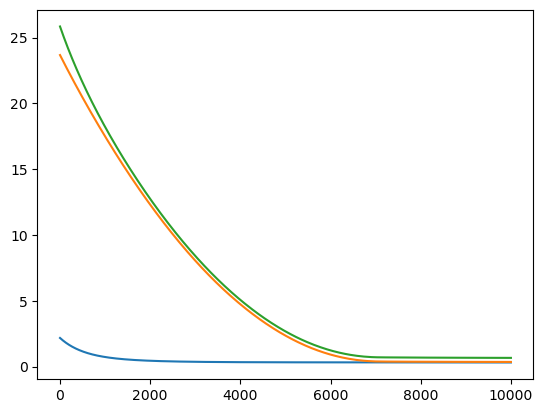

In [3]:
lasso = LASSO(optim="ProxSGD").fit(Df)
x, hists = lasso.transform(yf, 1e-2, 10000, lr=1e-3)
plt.plot(hists["mse"], label="mse - ProxSGD")
plt.plot(hists["l1"], label="l1 - ProxSGD")
plt.plot(hists["loss"], label="loss - ProxSGD")

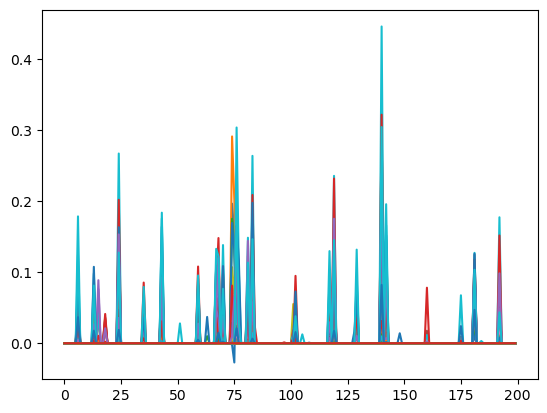

In [4]:
plt.plot(x.numpy().T)
plt.show()

Text(0, 0.5, 'SCI')

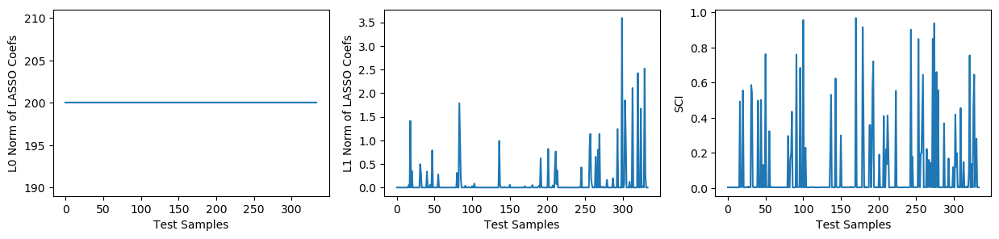

In [5]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci1(x.numpy())

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel("Test Samples")
ax[0].set_ylabel("L0 Norm of LASSO Coefs")
ax[1].plot(l1)
ax[1].set_xlabel("Test Samples")
ax[1].set_ylabel("L1 Norm of LASSO Coefs")
ax[2].plot(s)
ax[2].set_xlabel("Test Samples")
ax[2].set_ylabel("SCI")

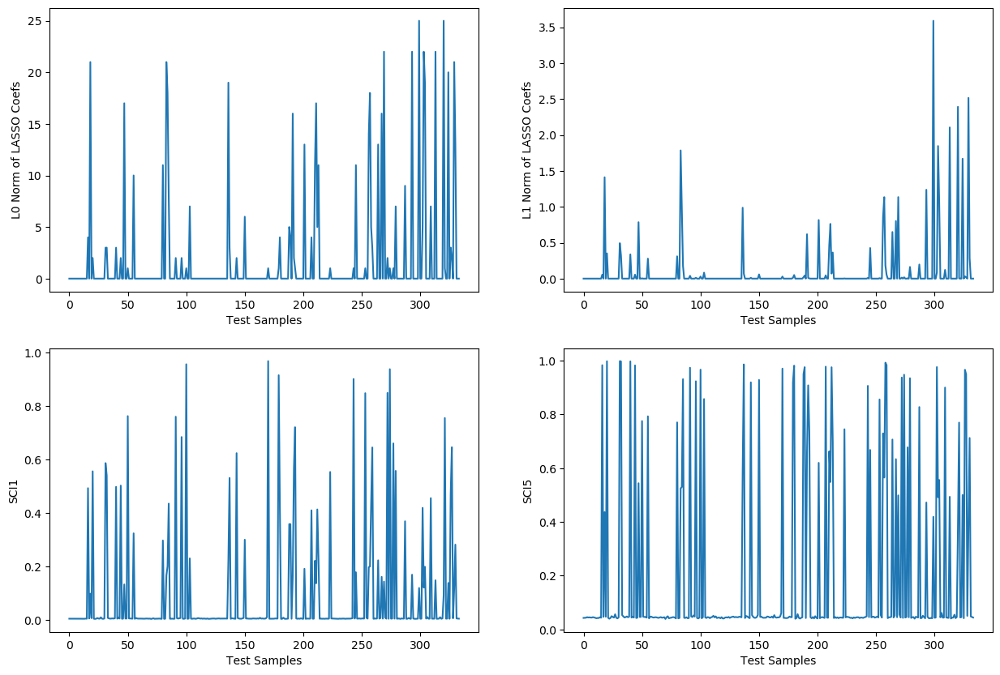

In [6]:
s1, s5 = show_sparsity(x.numpy())

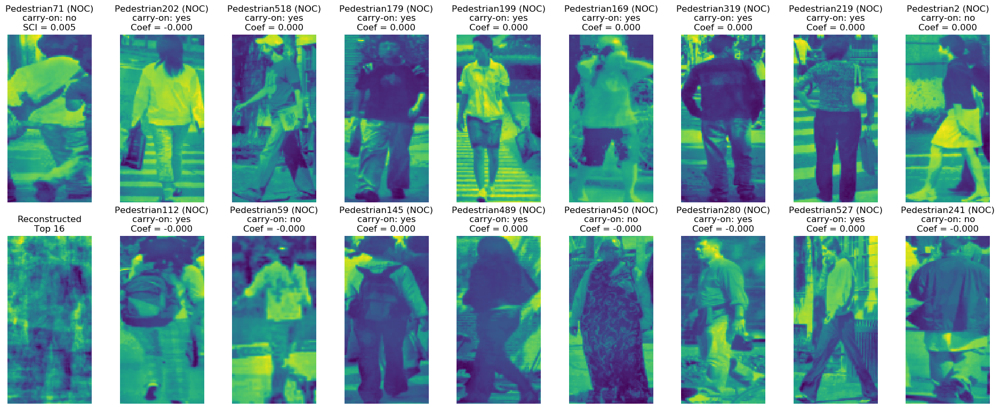

In [7]:
show_topk2(x, D, Dl, y, yl, s, 54, 16)

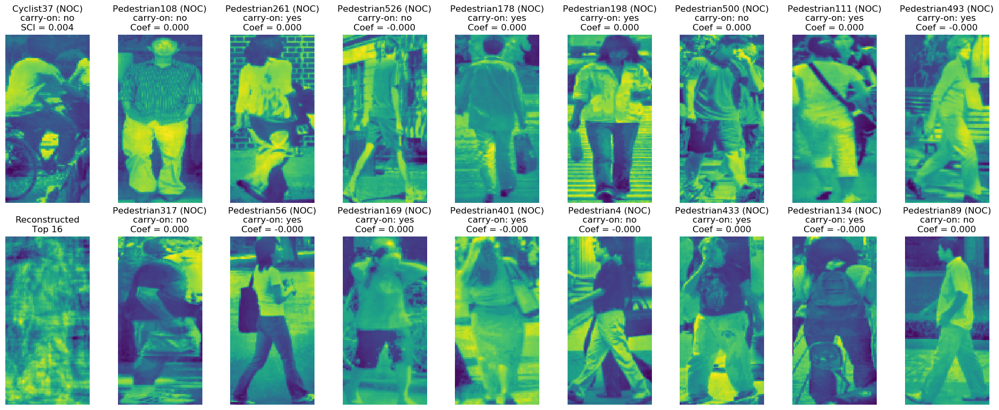

In [8]:
show_topk2(x, D, Dl, y, yl, s, 29, 16)

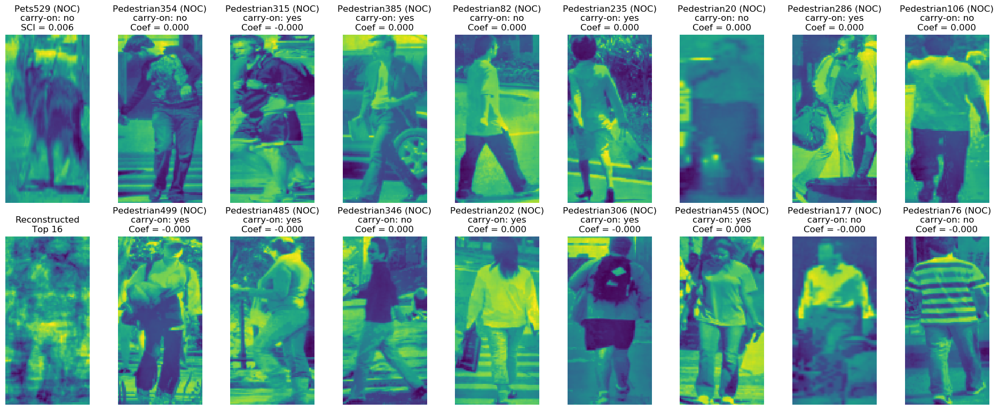

In [9]:
show_topk2(x, D, Dl, y, yl, s, 331, 16)

Text(0, 0.5, 'TPR')

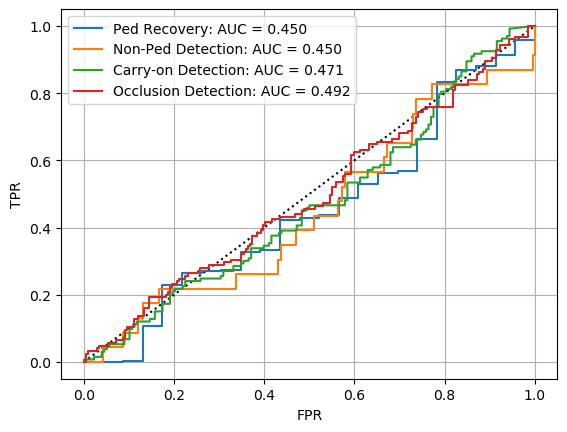

In [10]:
y_ped = yl[:, 1] == 0
y_noc = yl[:, 2] == 0

y_carry = yl[y_ped, 3:-1].sum(-1) != 0
y_carry_score = s5[y_ped]
for i in range(len(y_carry)):
    ids = np.argsort(np.abs(x[y_ped][i]))[-5:]
    d = Dl[ids, 3:-1].sum(-1) != 0
    y_carry_score[i] *= d.sum()

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_carry
sc = y_carry_score
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Carry-on Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_ped & ~y_noc
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Occlusion Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

### Proximal Adam Optimizer

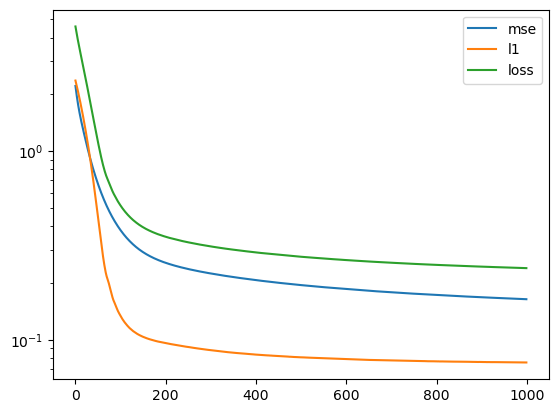

In [11]:
lasso = LASSO(optim="ProxAdam").fit(Df)
x, hists = lasso.transform(yf, 1e-3, 1000, lr=1e-3)
plt.plot(hists["mse"], label="mse")
plt.plot(hists["l1"], label="l1")
plt.plot(hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

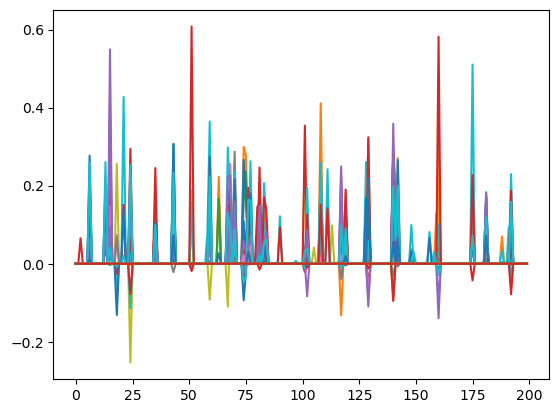

In [12]:
plt.plot(x.numpy().T)
plt.show()

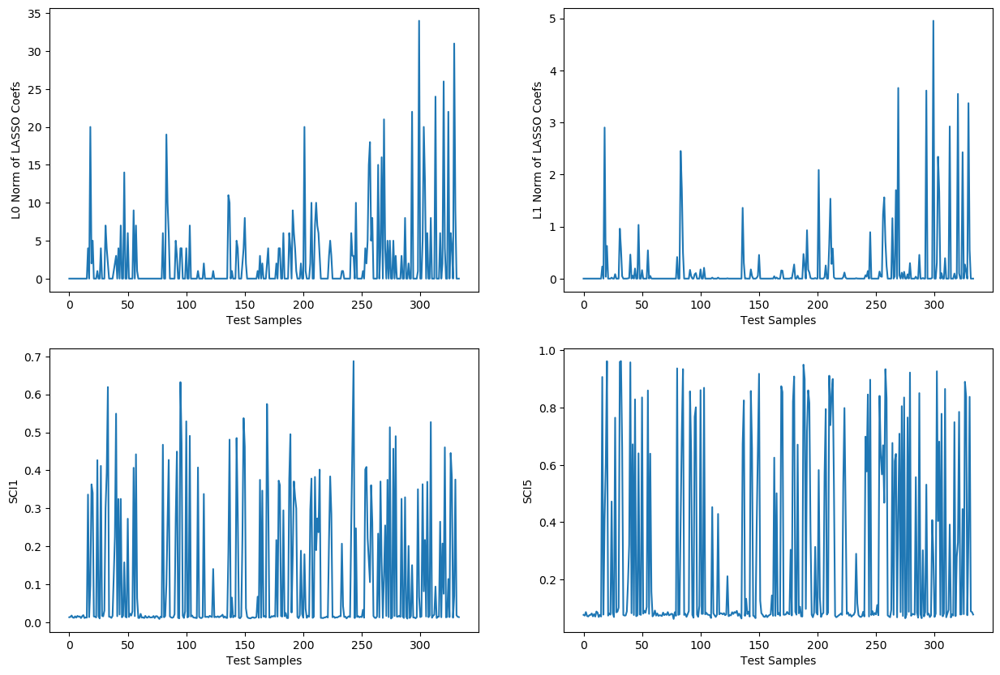

In [13]:
s1, s5 = show_sparsity(x.numpy())

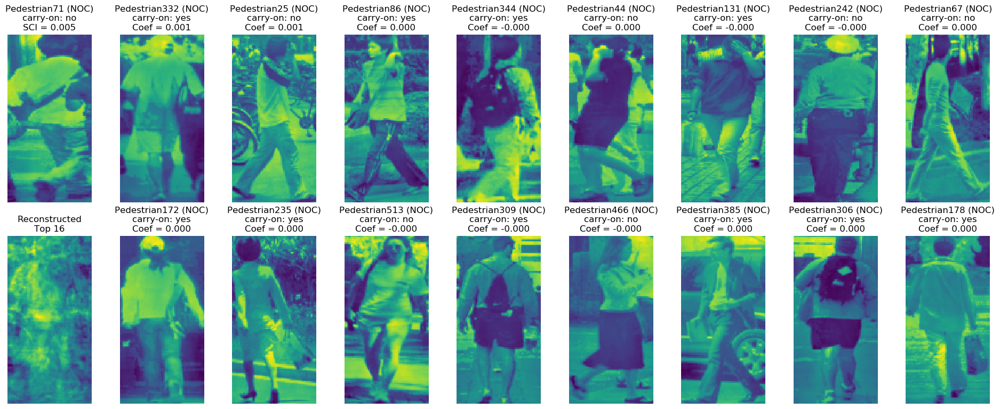

In [14]:
show_topk2(x, D, Dl, y, yl, s, 54, 16)

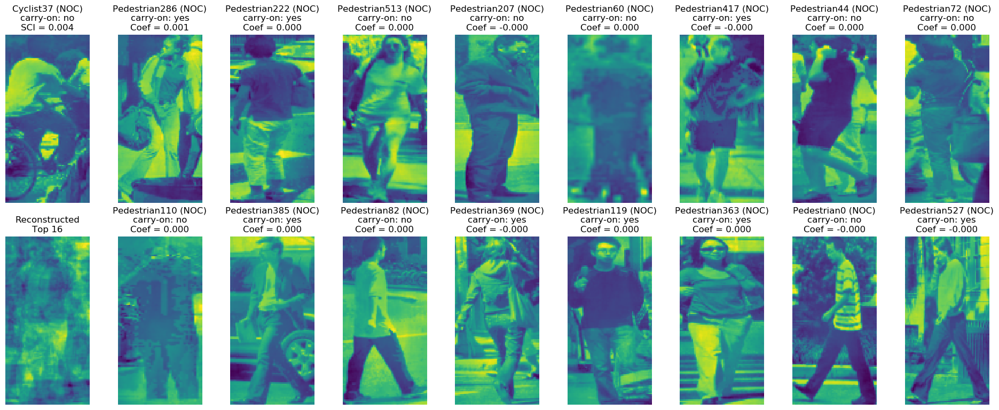

In [15]:
show_topk2(x, D, Dl, y, yl, s, 29, 16)

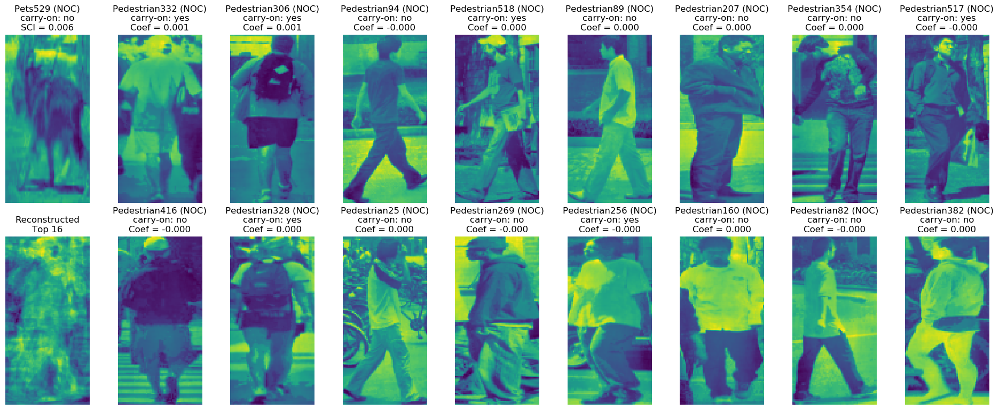

In [16]:
show_topk2(x, D, Dl, y, yl, s, 331, 16)

Text(0, 0.5, 'TPR')

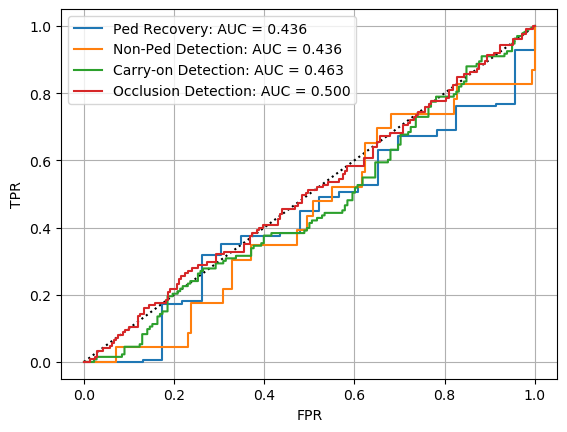

In [17]:
y_ped = yl[:, 1] == 0
y_noc = yl[:, 2] == 0

y_carry = yl[y_ped, 3:-1].sum(-1) != 0
y_carry_score = s5[y_ped]
for i in range(len(y_carry)):
    ids = np.argsort(np.abs(x[y_ped][i]))[-5:]
    d = Dl[ids, 3:-1].sum(-1) != 0
    y_carry_score[i] *= d.sum()

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_carry
sc = y_carry_score
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Carry-on Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_ped & ~y_noc
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Occlusion Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

### Raw Images with LASSO

### Proximal SGD Algorithm

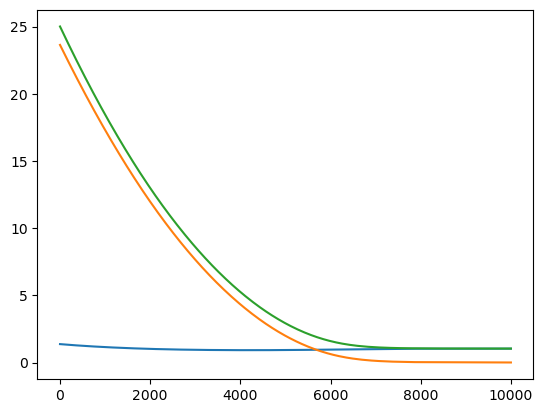

In [18]:
lasso = LASSO(optim="ProxSGD").fit(D)
x, hists = lasso.transform(y, 1e-2, 10000, lr=1e-3)
plt.plot(hists["mse"], label="mse - ProxSGD")
plt.plot(hists["l1"], label="l1 - ProxSGD")
plt.plot(hists["loss"], label="loss - ProxSGD")

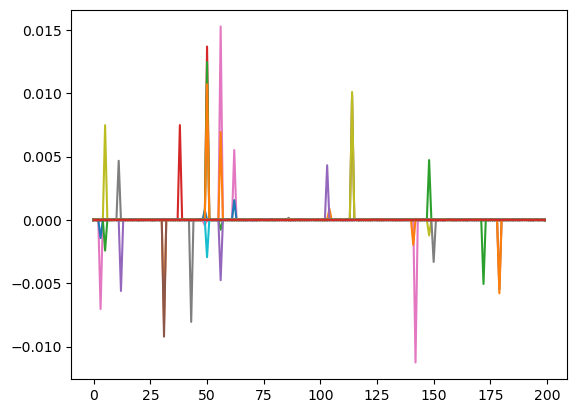

In [19]:
plt.plot(x.numpy().T)
plt.show()

Text(0, 0.5, 'SCI')

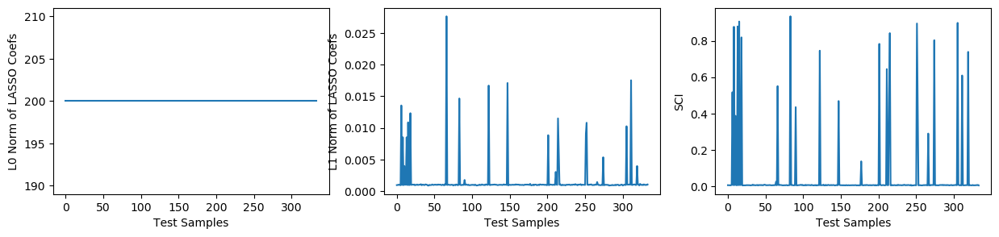

In [20]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci1(x.numpy())

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel("Test Samples")
ax[0].set_ylabel("L0 Norm of LASSO Coefs")
ax[1].plot(l1)
ax[1].set_xlabel("Test Samples")
ax[1].set_ylabel("L1 Norm of LASSO Coefs")
ax[2].plot(s)
ax[2].set_xlabel("Test Samples")
ax[2].set_ylabel("SCI")

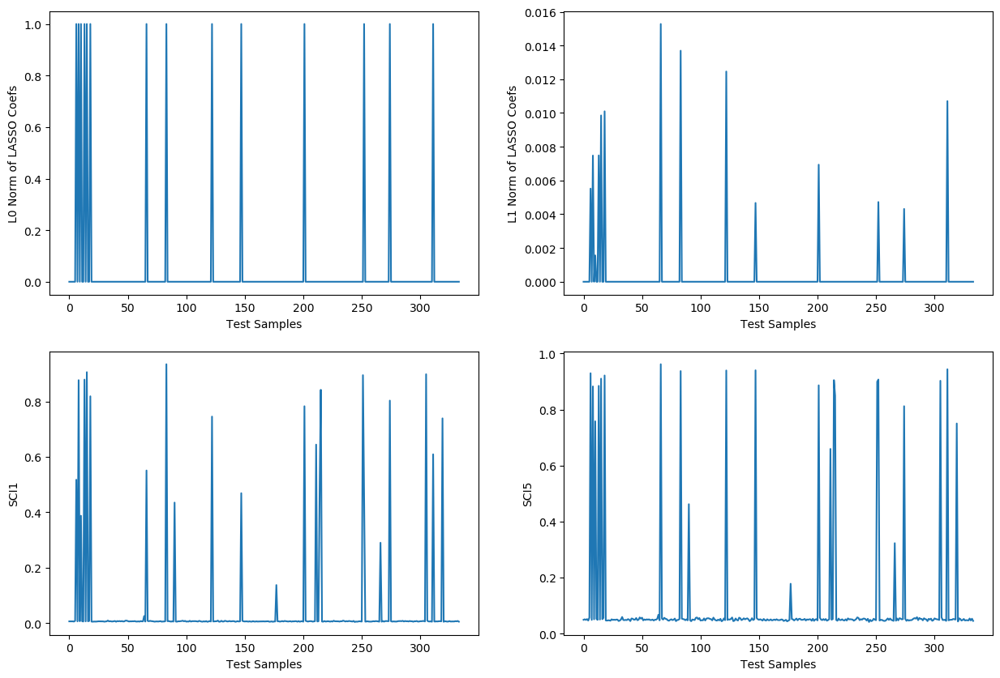

In [21]:
s1, s5 = show_sparsity(x.numpy())

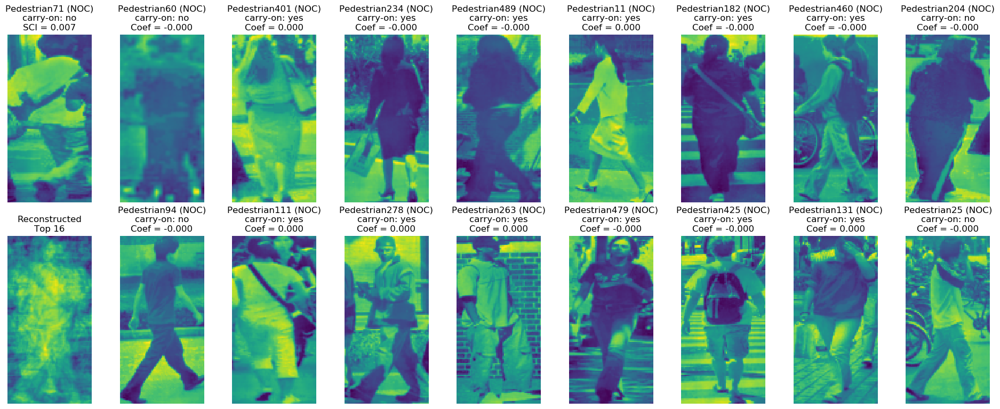

In [22]:
show_topk2(x, D, Dl, y, yl, s, 54, 16)

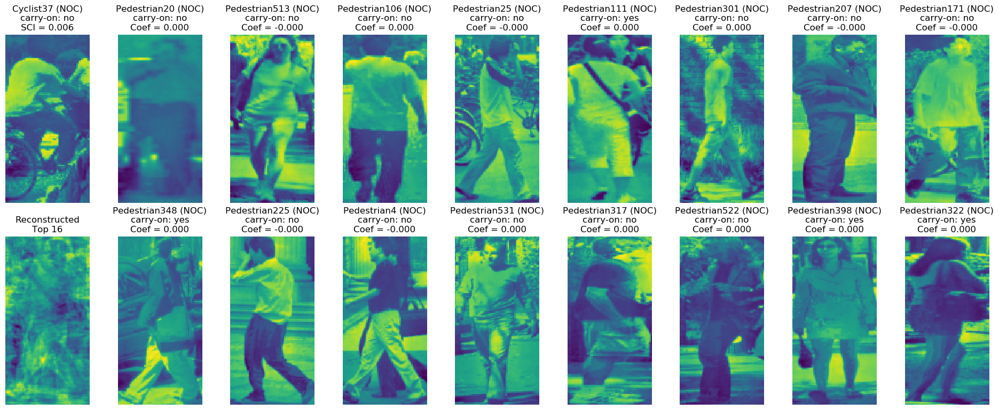

In [23]:
show_topk2(x, D, Dl, y, yl, s, 29, 16)

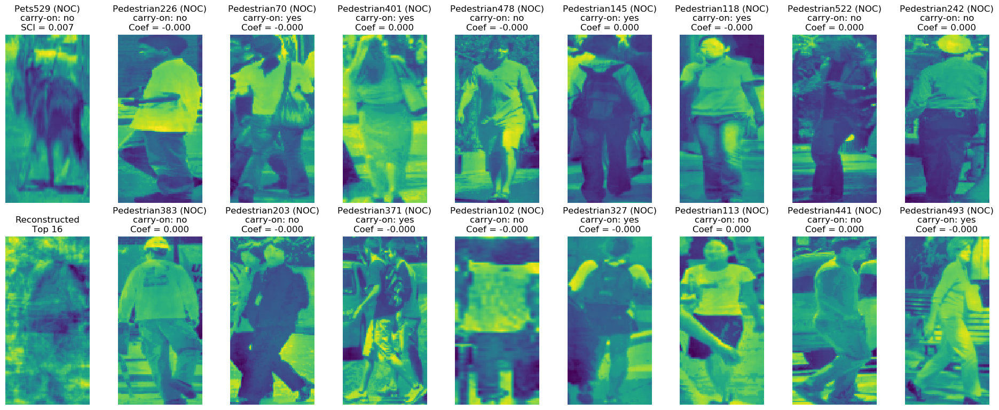

In [24]:
show_topk2(x, D, Dl, y, yl, s, 331, 16)

Text(0, 0.5, 'TPR')

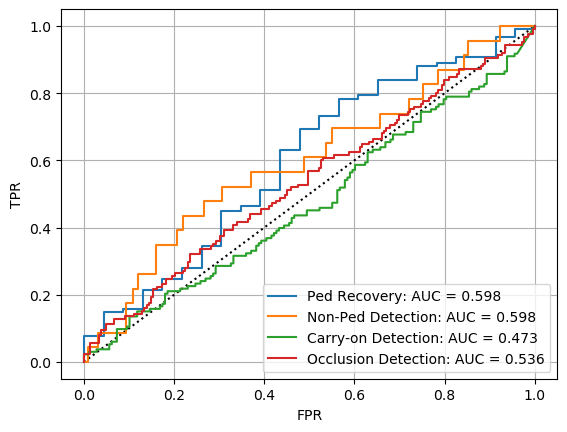

In [25]:
y_ped = yl[:, 1] == 0
y_noc = yl[:, 2] == 0

y_carry = yl[y_ped, 3:-1].sum(-1) != 0
y_carry_score = s5[y_ped]
for i in range(len(y_carry)):
    ids = np.argsort(np.abs(x[y_ped][i]))[-5:]
    d = Dl[ids, 3:-1].sum(-1) != 0
    y_carry_score[i] *= d.sum()

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_carry
sc = y_carry_score
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Carry-on Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_ped & ~y_noc
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Occlusion Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

### Proximal Adam Optimizer

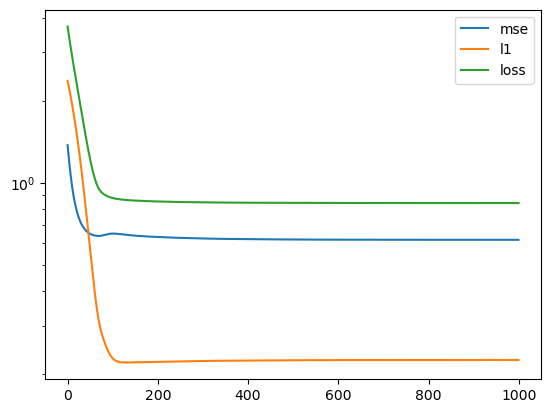

In [26]:
lasso = LASSO(optim="ProxAdam").fit(D)
x, hists = lasso.transform(y, 1e-3, 1000, lr=1e-3)
plt.plot(hists["mse"], label="mse")
plt.plot(hists["l1"], label="l1")
plt.plot(hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

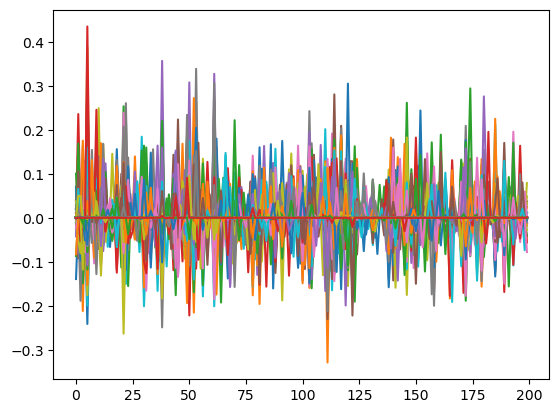

In [27]:
plt.plot(x.numpy().T)
plt.show()

Text(0, 0.5, 'SCI')

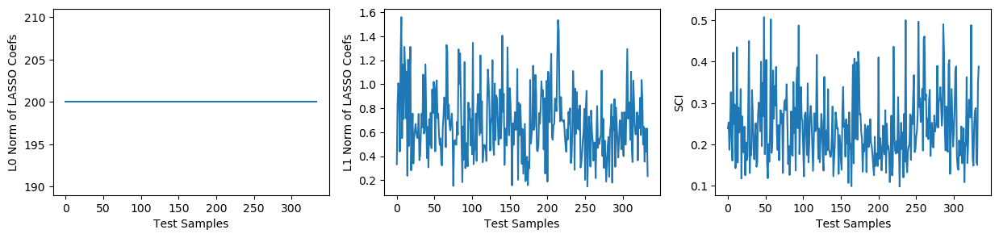

In [28]:
l0 = np.linalg.norm(x, ord=0, axis=1)
l1 = np.linalg.norm(x, ord=1, axis=1)
s = sci1(x.numpy())

fig, ax = plt.subplots(1, 3, figsize=(15, 3))

ax[0].plot(l0)
ax[0].set_xlabel("Test Samples")
ax[0].set_ylabel("L0 Norm of LASSO Coefs")
ax[1].plot(l1)
ax[1].set_xlabel("Test Samples")
ax[1].set_ylabel("L1 Norm of LASSO Coefs")
ax[2].plot(s)
ax[2].set_xlabel("Test Samples")
ax[2].set_ylabel("SCI")

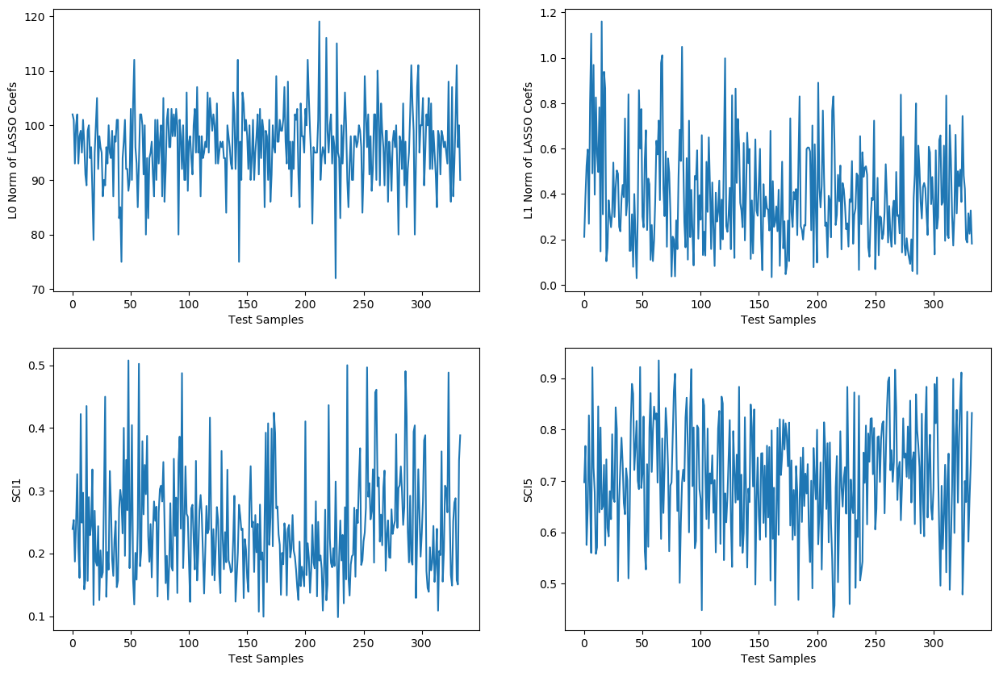

In [29]:
s1, s5 = show_sparsity(x.numpy(), eps=1e-5)

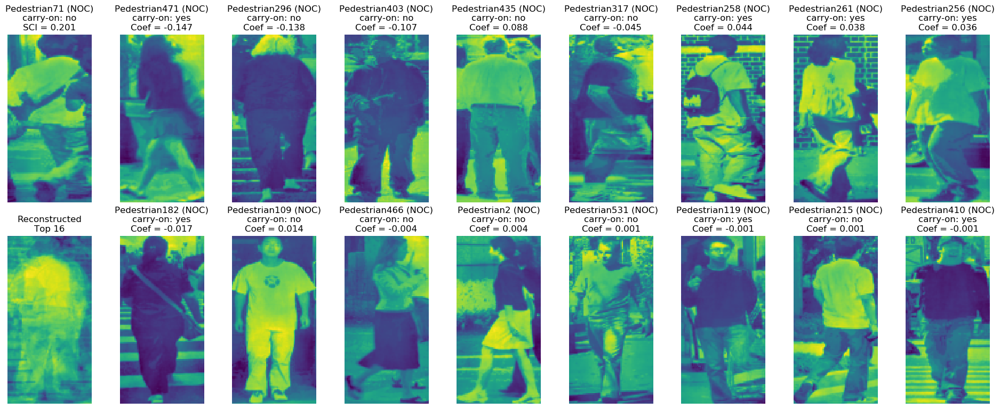

In [30]:
show_topk2(x, D, Dl, y, yl, s, 54, 16)

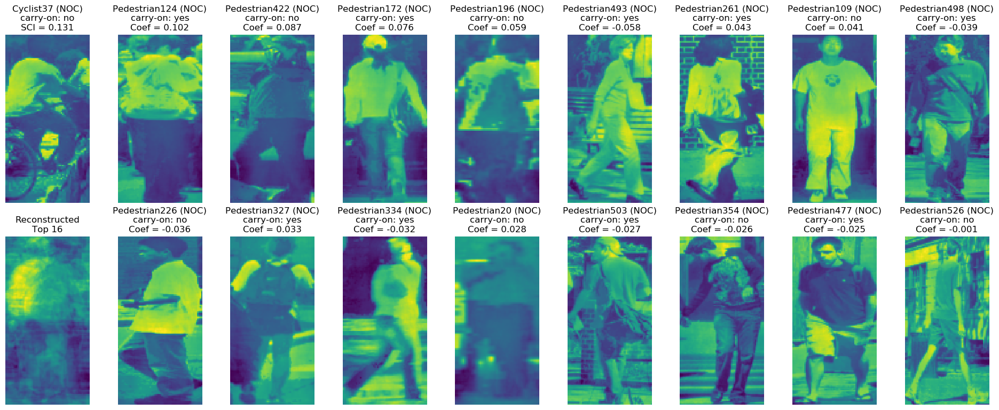

In [31]:
show_topk2(x, D, Dl, y, yl, s, 29, 16)

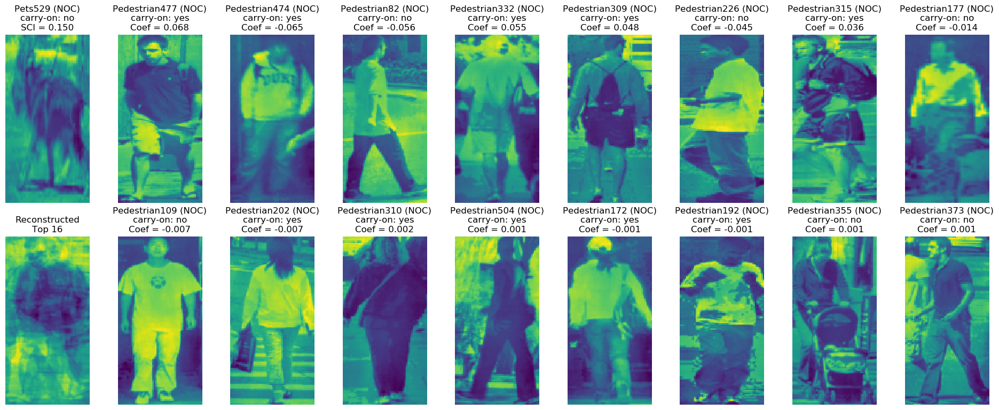

In [32]:
show_topk2(x, D, Dl, y, yl, s, 331, 16)

Text(0, 0.5, 'TPR')

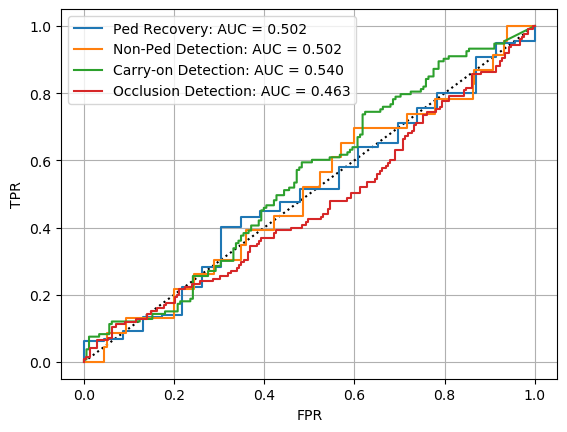

In [33]:
y_ped = yl[:, 1] == 0
y_noc = yl[:, 2] == 0

y_carry = yl[y_ped, 3:-1].sum(-1) != 0
y_carry_score = s5[y_ped]
for i in range(len(y_carry)):
    ids = np.argsort(np.abs(x[y_ped][i]))[-5:]
    d = Dl[ids, 3:-1].sum(-1) != 0
    y_carry_score[i] *= d.sum()

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_carry
sc = y_carry_score
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Carry-on Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = y_ped & ~y_noc
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Occlusion Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

## ResNet Features with Dictionary Learning

### Proximal SGD Algorithm

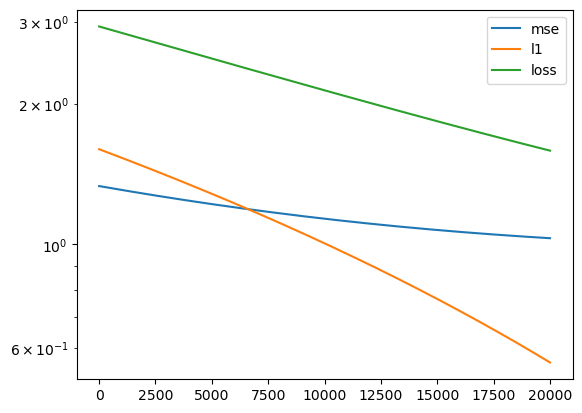

In [34]:
dict = DictLearn(256, "ProxSGD").fit(Df, 1e-3, 20000, lr=1e-3)
plt.plot(dict.hists["mse"], label="mse")
plt.plot(dict.hists["l1"], label="l1")
plt.plot(dict.hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

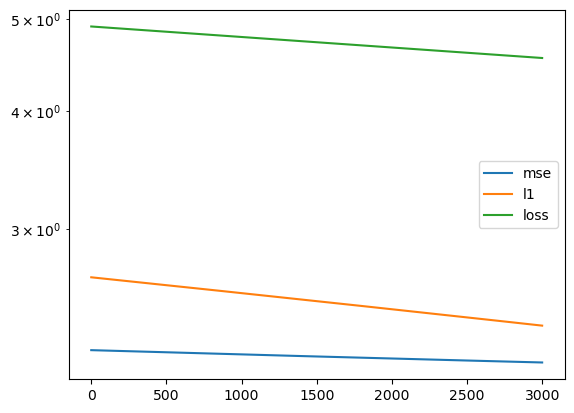

In [35]:
x, hists = dict.transform(yf, 1e-3, 3000, lr=1e-3)
plt.plot(hists["mse"], label="mse")
plt.plot(hists["l1"], label="l1")
plt.plot(hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

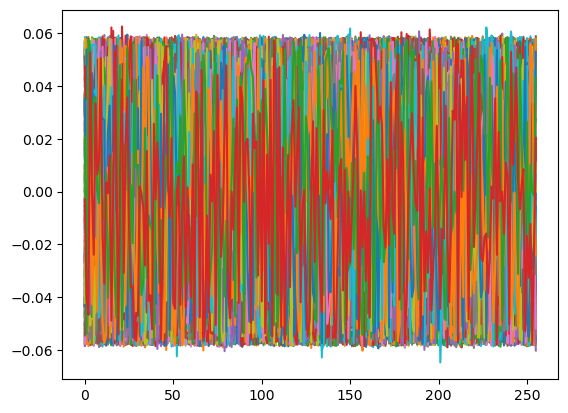

In [36]:
plt.plot(x.numpy().T)
plt.show()

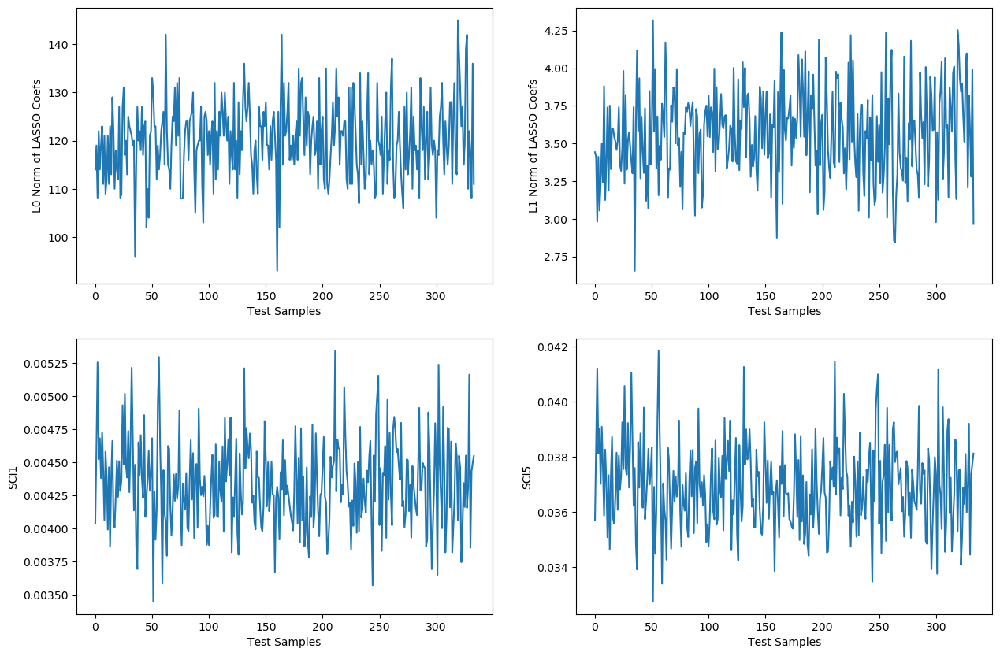

In [37]:
s1, s5 = show_sparsity(x.numpy())

Text(0, 0.5, 'TPR')

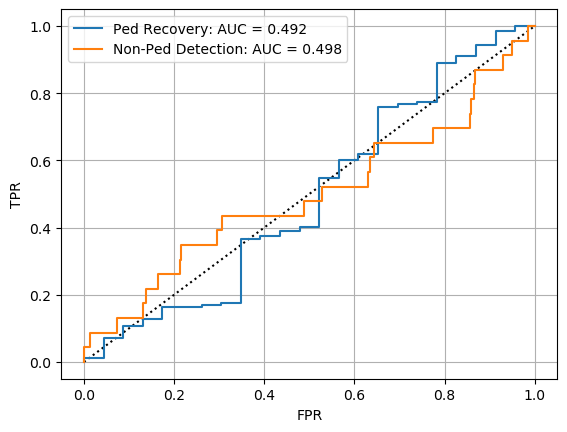

In [38]:
y_ped = yl[:, 1] == 0

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

### Proximal Adam Optimizer

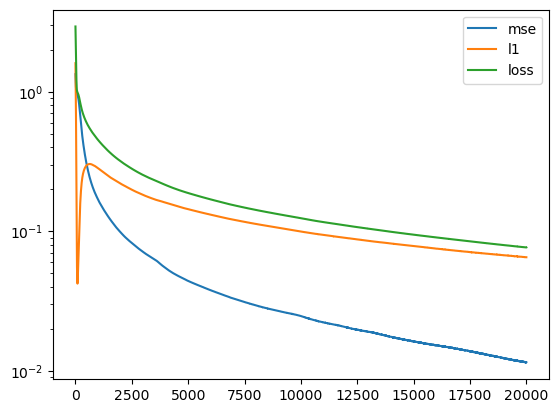

In [39]:
dict = DictLearn(256, "ProxAdam").fit(Df, 1e-3, 20000, lr=1e-3)
plt.plot(dict.hists["mse"], label="mse")
plt.plot(dict.hists["l1"], label="l1")
plt.plot(dict.hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

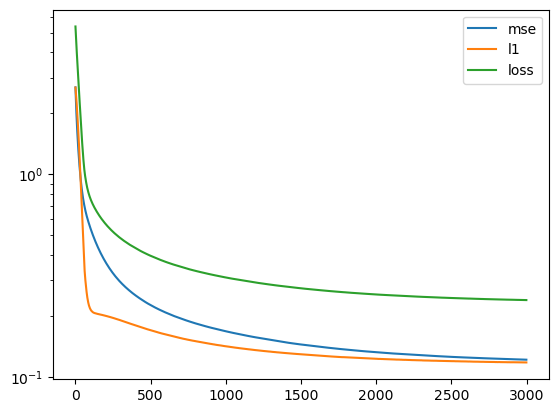

In [40]:
x, hists = dict.transform(yf, 1e-3, 3000, lr=1e-3)
plt.plot(hists["mse"], label="mse")
plt.plot(hists["l1"], label="l1")
plt.plot(hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

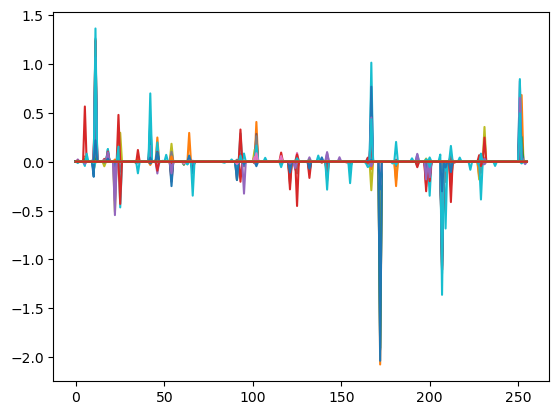

In [41]:
plt.plot(x.numpy().T)
plt.show()

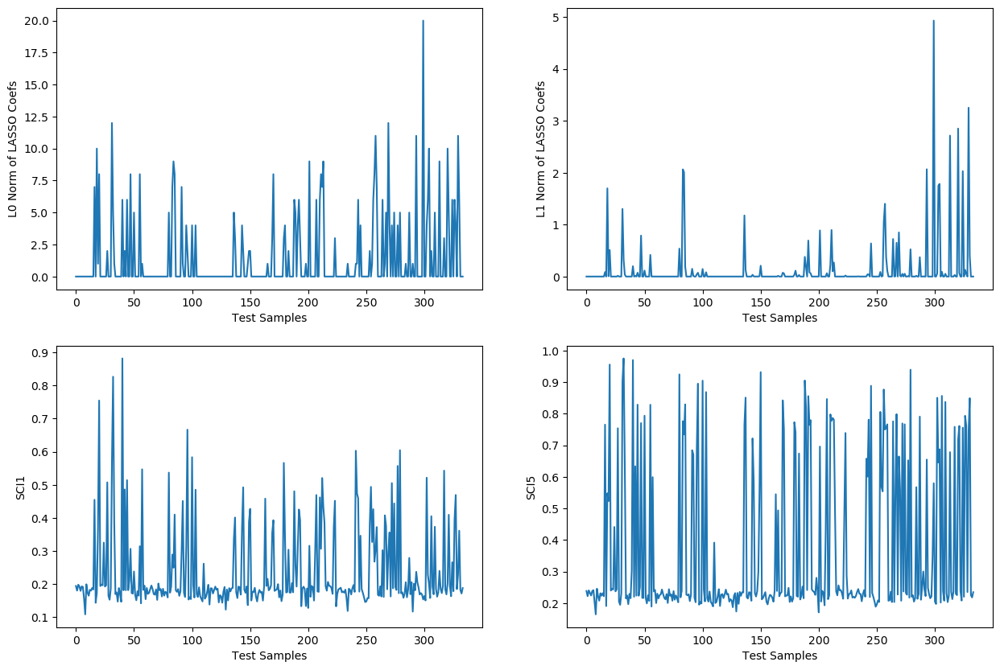

In [42]:
s1, s5 = show_sparsity(x.numpy())

Text(0, 0.5, 'TPR')

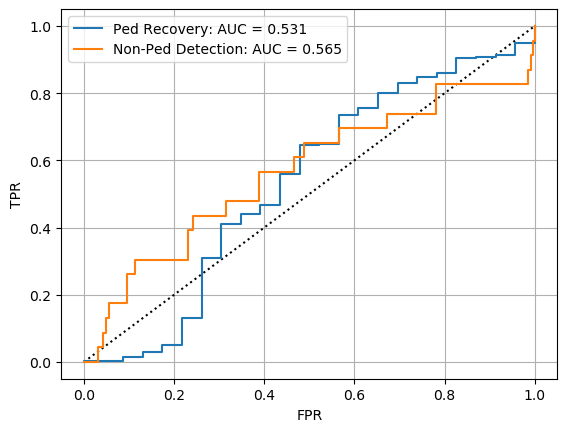

In [43]:
y_ped = yl[:, 1] == 0

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

### Raw Images with Dictionary Learning

### Proximal SGD Algorithm

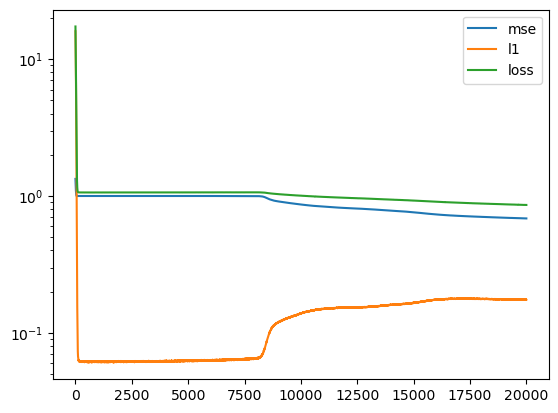

In [44]:
dict = DictLearn(256, "ProxAdam").fit(D, 1e-2, 20000, lr=1e-3)
plt.plot(dict.hists["mse"], label="mse")
plt.plot(dict.hists["l1"], label="l1")
plt.plot(dict.hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

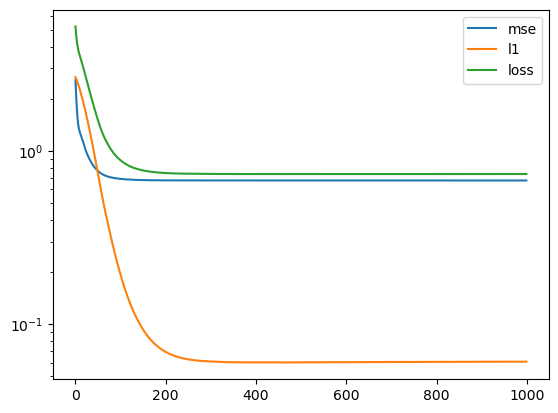

In [45]:
x, hists = dict.transform(y, 1e-3, 1000, lr=1e-3)
plt.plot(hists["mse"], label="mse")
plt.plot(hists["l1"], label="l1")
plt.plot(hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

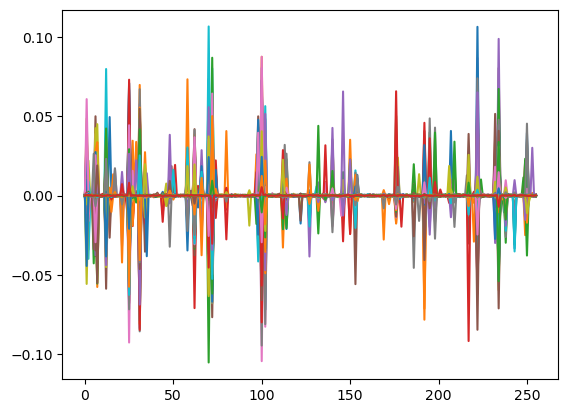

In [46]:
plt.plot(x.numpy().T)
plt.show()

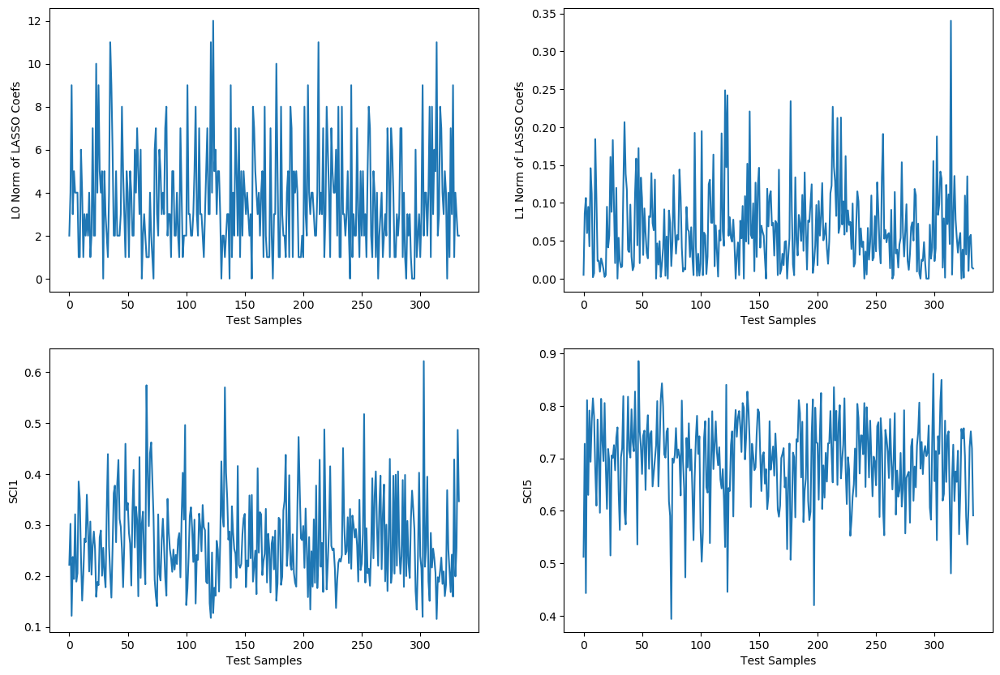

In [47]:
s1, s5 = show_sparsity(x.numpy())

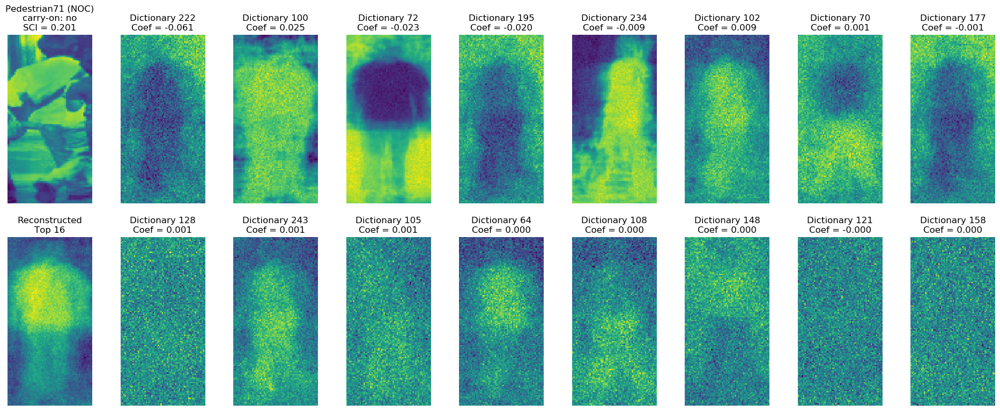

In [48]:
show_topd2(dict, x, y, yl, s, 54, 16)

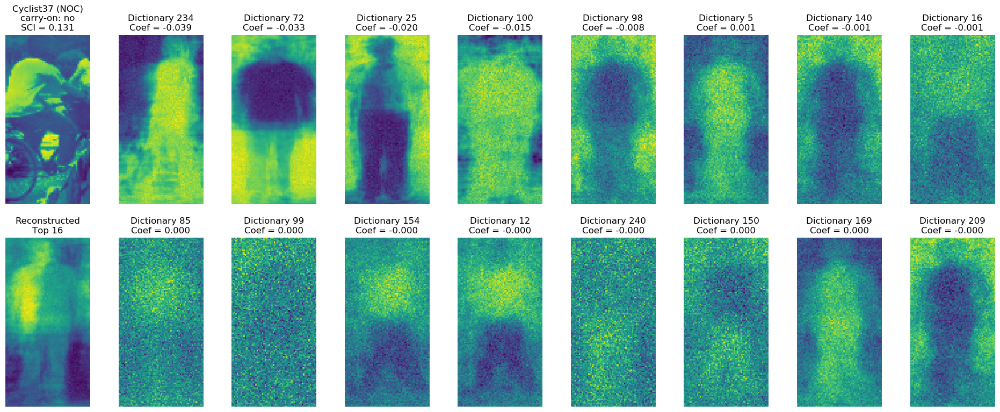

In [49]:
show_topd2(dict, x, y, yl, s, 29, 16)

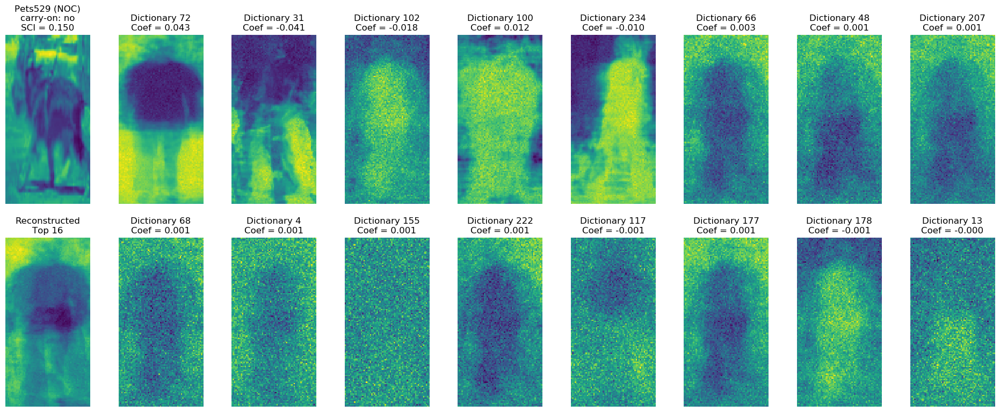

In [50]:
show_topd2(dict, x, y, yl, s, 331, 16)

Text(0, 0.5, 'TPR')

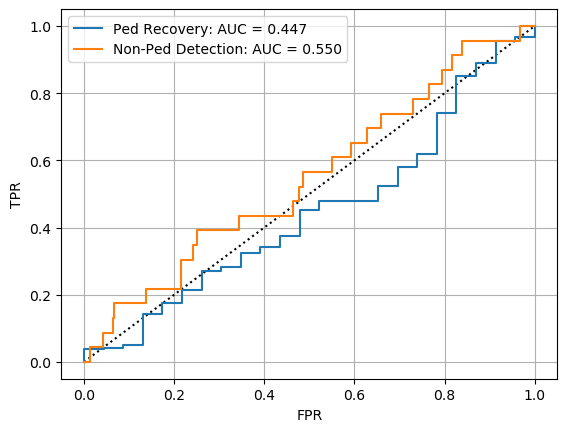

In [51]:
y_ped = yl[:, 1] == 0

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")

### Proximal Adam Algorithm

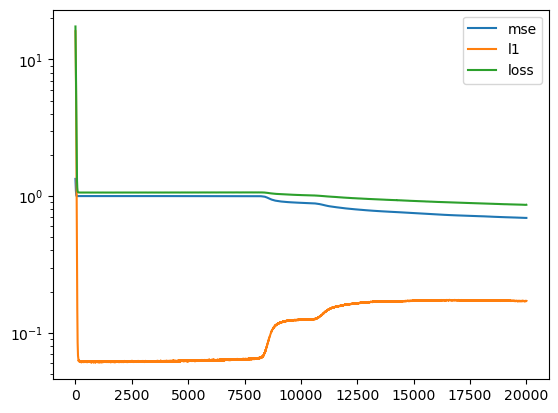

In [52]:
dict = DictLearn(256, "ProxAdam").fit(D, 1e-2, 20000, lr=1e-3)
plt.plot(dict.hists["mse"], label="mse")
plt.plot(dict.hists["l1"], label="l1")
plt.plot(dict.hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

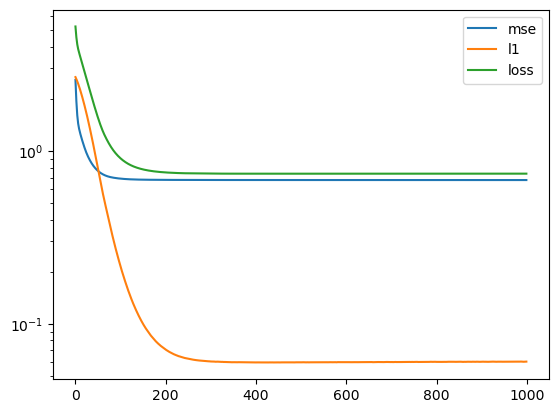

In [53]:
x, hists = dict.transform(y, 1e-3, 1000, lr=1e-3)
plt.plot(hists["mse"], label="mse")
plt.plot(hists["l1"], label="l1")
plt.plot(hists["loss"], label="loss")
plt.legend()
plt.yscale("log")

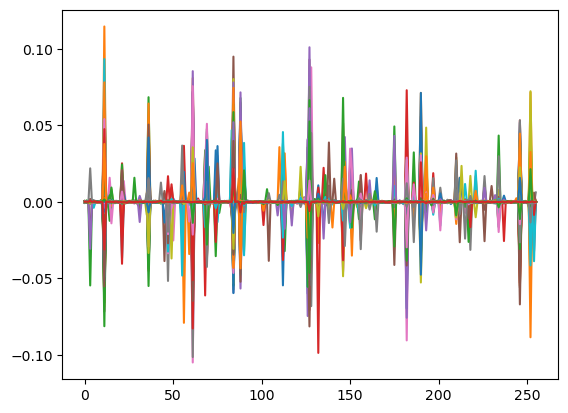

In [54]:
plt.plot(x.numpy().T)
plt.show()

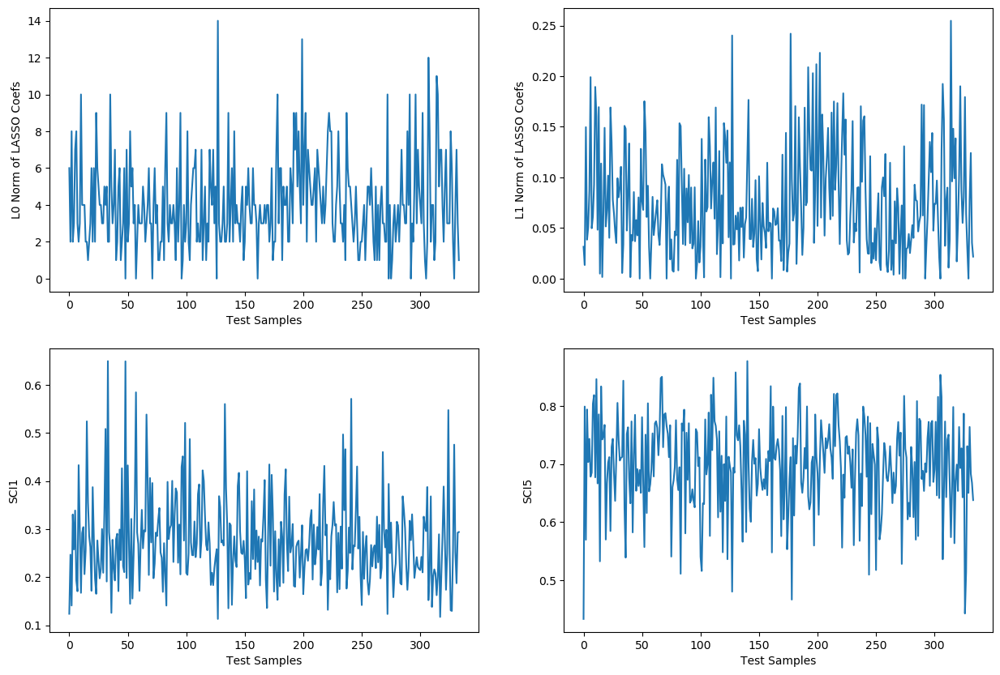

In [55]:
s1, s5 = show_sparsity(x.numpy())

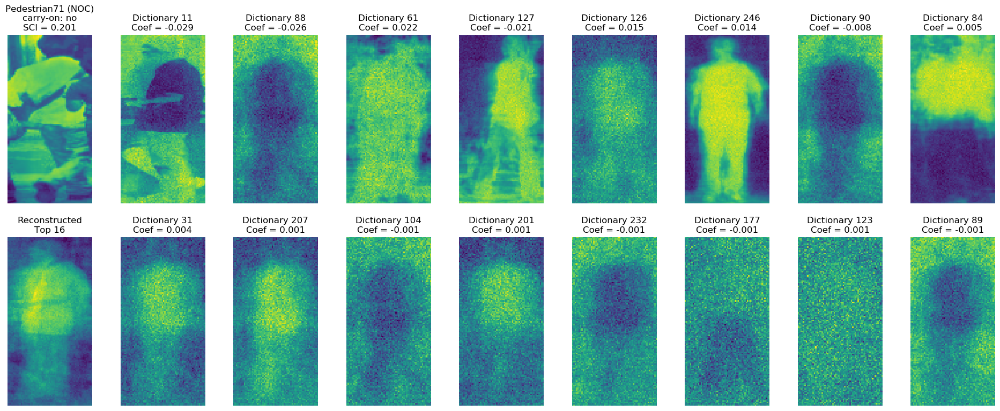

In [56]:
show_topd2(dict, x, y, yl, s, 54, 16)

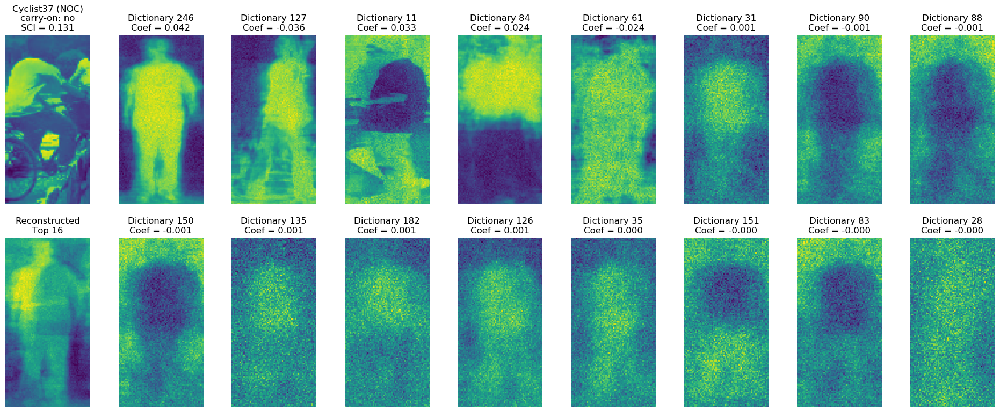

In [57]:
show_topd2(dict, x, y, yl, s, 29, 16)

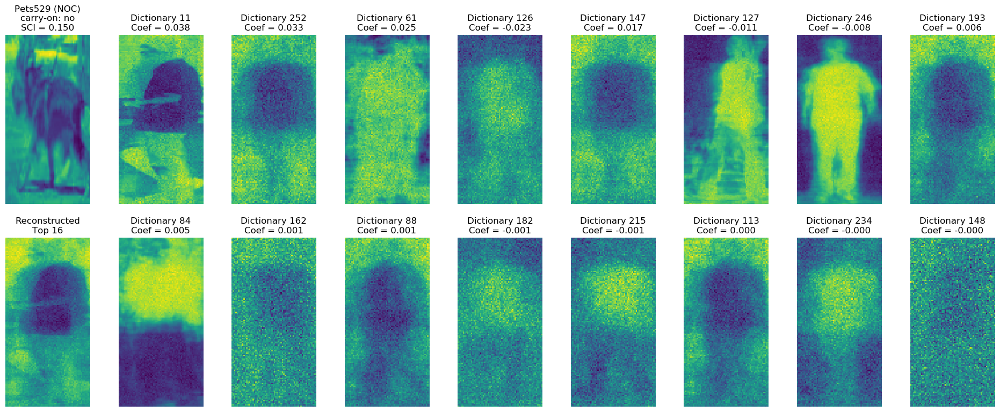

In [58]:
show_topd2(dict, x, y, yl, s, 331, 16)

Text(0, 0.5, 'TPR')

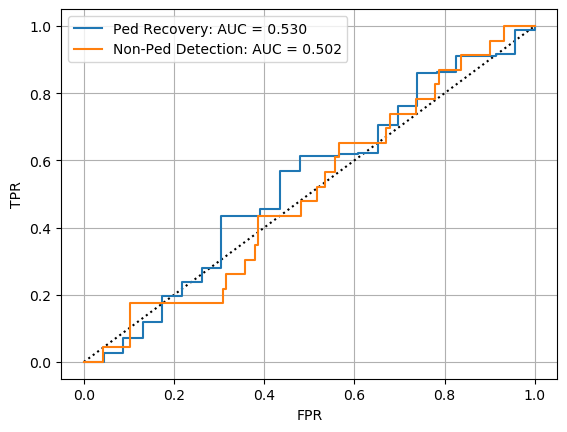

In [59]:
y_ped = yl[:, 1] == 0

plt.plot([0, 1], [0, 1], "k:")

gt = y_ped
sc = s1
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Ped Recovery: AUC = {:.3f}".format(auc(fpr, tpr)))

gt = ~y_ped
sc = 1 - s5
fpr, tpr, _ = roc_curve(gt, sc)
plt.plot(fpr, tpr, label="Non-Ped Detection: AUC = {:.3f}".format(auc(fpr, tpr)))

plt.legend()
plt.grid("on")
plt.xlabel("FPR")
plt.ylabel("TPR")